In [100]:
import numpy as np
import numpy.matlib
from matplotlib import pyplot as plt
import math
import time
from keras.datasets import mnist

### Flatten the image (1D array), array of pixels of each image as a feature 

In [101]:
(Xtr, Ltr), (X_test, L_test) = mnist.load_data()
sample_size = 100

Xtr = Xtr[:sample_size]
Ltr = Ltr[:sample_size]

X_test = X_test[:sample_size]
L_test = L_test[:sample_size]


Xtr_flatten = Xtr.reshape(Xtr.shape[0], -1) /255
X_test_flatten = X_test.reshape(X_test.shape[0], -1) /255

print(Xtr.shape)
print(X_test.shape)

(100, 28, 28)
(100, 28, 28)


In [102]:
def getEuclideanDistance(single_point,array):
    nrows, ncols, nfeatures=array.shape[0],array.shape[1], array.shape[2]
    points=array.reshape((nrows*ncols,nfeatures))
                         
    dist = (points - single_point)**2
    dist = np.sum(dist, axis=1)
    dist = np.sqrt(dist)

    dist=dist.reshape((nrows,ncols))
    return dist

In [103]:

mu, sigma = 0, 0.1
A = np.random.normal(mu, sigma, 10)
#A.shape, A

In [104]:
nrows,ncols,nfeatures=3,3,3

#Generate coordinate system
x,y=np.meshgrid(range(ncols),range(nrows))

In [105]:

sgm0=2
sgmdecay=0.05
t=1
sgm = sgm0 * math.exp(-t*sgmdecay);

width = math.ceil(sgm*3)

dist=np.array([[2,1,3],[3,2,3],[4,4,4]])
bmurow, bmucol =np.unravel_index(np.argmin(dist, axis=None), dist.shape) 

g = np.exp(-((np.power(x - bmucol,2)) + (np.power(y - bmurow,2))) / (2*sgm*sgm));


fromrow = max(0,bmurow - width);
torow   = min(bmurow + width,nrows);
fromcol = max(0,bmucol - width);
tocol   = min(bmucol + width,ncols);



In [106]:
G = np.dstack([g[fromrow:torow,fromcol:tocol]]*nfeatures);



In [107]:
def SOM (dispRes, trainingData, ndim=10, nepochs=10, eta0=0.1, etadecay=0.05, sgm0=20, sgmdecay=0.05, showMode=0):
    nfeatures=trainingData.shape[1]
    ntrainingvectors=trainingData.shape[0]
    
    nrows = ndim
    ncols = ndim
    
    mu, sigma = 0, 0.1
    numpy.random.seed(int(time.time()))
    som = np.random.normal(mu, sigma, (nrows,ncols,nfeatures))

    if showMode >= 1:
        print("\nSOM features before training with",ndim ," dim: \n")
        
        fig, ax=plt.subplots(nrows=nrows, ncols=ncols, figsize=(15,15))
        
        for k in range(nrows):
            for l in range (ncols):
                A=som[k,l,:].reshape((dispRes[0],dispRes[1]))
                ax[k,l].imshow(A,cmap="plasma")
                ax[k,l].set_yticks([])
                ax[k,l].set_xticks([])   
    
    #Generate coordinate system
    x,y=np.meshgrid(range(ncols),range(nrows))
    
    	
    for t in range (1,nepochs+1):
        #Compute the learning rate for the current epoch
        eta = eta0 * math.exp(-t*etadecay);
        
        #Compute the variance of the Gaussian (Neighbourhood) function for the ucrrent epoch
        sgm = sgm0 * math.exp(-t*sgmdecay);
        
        #Consider the width of the Gaussian function as 3 sigma
        width = math.ceil(sgm*3);
        
        for ntraining in range(ntrainingvectors):
            trainingVector = trainingData[ntraining,:];
            
            # Compute the Euclidean distance between the training vector and
            # each neuron in the SOM map
            dist = getEuclideanDistance(trainingVector, som);
       
            # Find 2D coordinates of the Best Matching Unit (bmu)
            bmurow, bmucol =np.unravel_index(np.argmin(dist, axis=None), dist.shape) ;
            
            
            #Generate a Gaussian function centered on the location of the bmu
            g = np.exp(-((np.power(x - bmucol,2)) + (np.power(y - bmurow,2))) / (2*sgm*sgm));

            #Determine the boundary of the local neighbourhood
            fromrow = max(0,bmurow - width);
            torow   = min(bmurow + width,nrows);
            fromcol = max(0,bmucol - width);
            tocol   = min(bmucol + width,ncols);

            
            #Get the neighbouring neurons and determine the size of the neighbourhood
            neighbourNeurons = som[fromrow:torow,fromcol:tocol,:];
            sz = neighbourNeurons.shape;
            
            #Transform the training vector and the Gaussian function into 
            # multi-dimensional to facilitate the computation of the neuron weights update
            T = np.matlib.repmat(trainingVector,sz[0]*sz[1],1).reshape((sz[0],sz[1],nfeatures));                   
            G = np.dstack([g[fromrow:torow,fromcol:tocol]]*nfeatures);

            # Update the weights of the neurons that are in the neighbourhood of the bmu
            neighbourNeurons = neighbourNeurons + eta * G * (T - neighbourNeurons);

            
            #Put the new weights of the BMU neighbouring neurons back to the
            #entire SOM map
            som[fromrow:torow,fromcol:tocol,:] = neighbourNeurons;

    if showMode >= 1:
        print("\nSOM features AFTER training",ndim ," dim: \n")
        
        fig, ax=plt.subplots(nrows=nrows, ncols=ncols, figsize=(15,15))
        
        for k in range(nrows):
            for l in range (ncols):
                A=som[k,l,:].reshape((dispRes[0],dispRes[1]))
                ax[k,l].imshow(A,cmap="plasma")
                ax[k,l].set_yticks([])
            ax[k,l].set_xticks([])   
    return som
    

In [108]:
import pandas as pd
def parse_input_zoo_data(filename, header='infer'):

    input_data = pd.read_csv(filename, header=header)

    classes = input_data[17].tolist()
    labels = input_data[0].tolist()
    input_database = {
        # 0: input_data.iloc[:, [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]].values
        0: input_data[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]].to_numpy()
    }

    return input_database, labels, classes

In [109]:
input_filename = 'data/zoo.txt'
input_vector_database, labels, classes = parse_input_zoo_data(input_filename, None)


In [110]:
# som_trained=SOM ([4,4],input_vector_database[0], ndim=10, nepochs=100, eta0=0.01, etadecay=0.05, sgm0=20, sgmdecay=0.05, showMode=1)


In [111]:
# number_of_dimensions = [20,40,80]

# for ndim in number_of_dimensions:
#     som_trained_20x20=SOM ([28,28],Xtr, ndim, showMode=1)

# plt.show()


In [112]:
#verification of correctness on the training set:



def SOM_Test (trainingData, som_, classes, grid_, ConfusionMatrix, ndim=60):
    nfeatures=trainingData.shape[1]
    ntrainingvectors=trainingData.shape[0]
    
    nrows = ndim
    ncols = ndim
    
    nclasses=np.max(classes)

    som_cl=np.zeros((ndim,ndim,nclasses+1))
    
    
    for ntraining in range(ntrainingvectors):
        trainingVector = trainingData[ntraining,:];
        class_of_sample= classes[ntraining]    
        # Compute the Euclidean distance between the training vector and
        # each neuron in the SOM map
        dist = getEuclideanDistance(trainingVector, som_);
       
        # Find 2D coordinates of the Best Matching Unit (bmu)
        bmurow, bmucol =np.unravel_index(np.argmin(dist, axis=None), dist.shape) ;
        
        
        som_cl[bmurow, bmucol,class_of_sample]=som_cl[bmurow, bmucol,class_of_sample]+1
    
    
    
    for i in range (nrows):
        for j in range (ncols):
            grid_[i,j]=np.argmax(som_cl[i,j,:])

 
    for ntraining in range(ntrainingvectors):
        trainingVector = trainingData[ntraining,:];
        class_of_sample= classes[ntraining]    
        # Compute the Euclidean distance between the training vector and
        # each neuron in the SOM map
        dist = getEuclideanDistance(trainingVector, som_);
       
        # Find 2D coordinates of the Best Matching Unit (bmu)
        bmurow, bmucol =np.unravel_index(np.argmin(dist, axis=None), dist.shape) ;
        
        predicted=np.argmax(som_cl[bmurow, bmucol,:])
        ConfusionMatrix[class_of_sample-1, predicted-1]=ConfusionMatrix[class_of_sample-1, predicted-1]+1
        
    return grid_, ConfusionMatrix
    



In [113]:
def getConfusionMatrix(train_data, SOM, ndim, npochs=10, eta0=0.1, etadecay=0.05):
    nrows=ndim
    ncols=ndim
    grid_color=np.zeros((nrows,ncols))
    nclasses=np.max(classes)

    confusion_matrix=np.zeros((nclasses,nclasses))
    grid_color,confusion_matrix=SOM_Test (train_data, SOM, classes, grid_color, confusion_matrix, ndim)

    # plt.close()
    # plt.imshow(grid_color)
    # plt.show()

    return confusion_matrix, Xtr_flatten.shape, np.sum(confusion_matrix)

print("Training Set")
som_20x20 = SOM([28,28], Xtr_flatten, ndim=20)
confusion_matrix, shape, sum_matrix = getConfusionMatrix(Xtr_flatten, som_20x20, ndim=20)
print(confusion_matrix)



Training Set
[[41.  0.  0.  0.  0.  0.  0.]
 [13.  6.  0.  0.  0.  0.  0.]
 [ 2.  1.  2.  0.  0.  0.  0.]
 [ 9.  0.  0.  4.  0.  0.  0.]
 [ 2.  0.  0.  1.  1.  0.  0.]
 [ 6.  0.  0.  0.  0.  2.  0.]
 [ 8.  0.  0.  1.  0.  0.  1.]]



SOM features before training with 20  dim: 


SOM features AFTER training 20  dim: 

20x20 Training Accuracy: 0.62
20x20 Test Accuracy: 0.7

SOM features before training with 40  dim: 


SOM features AFTER training 40  dim: 

40x40 Training Accuracy: 0.74
40x40 Test Accuracy: 0.84

SOM features before training with 80  dim: 


SOM features AFTER training 80  dim: 

80x80 Training Accuracy: 0.88
80x80 Test Accuracy: 0.89


C:\Users\boink\AppData\Local\Temp\ipykernel_20516\965769471.py:50: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  plt.tight_layout()


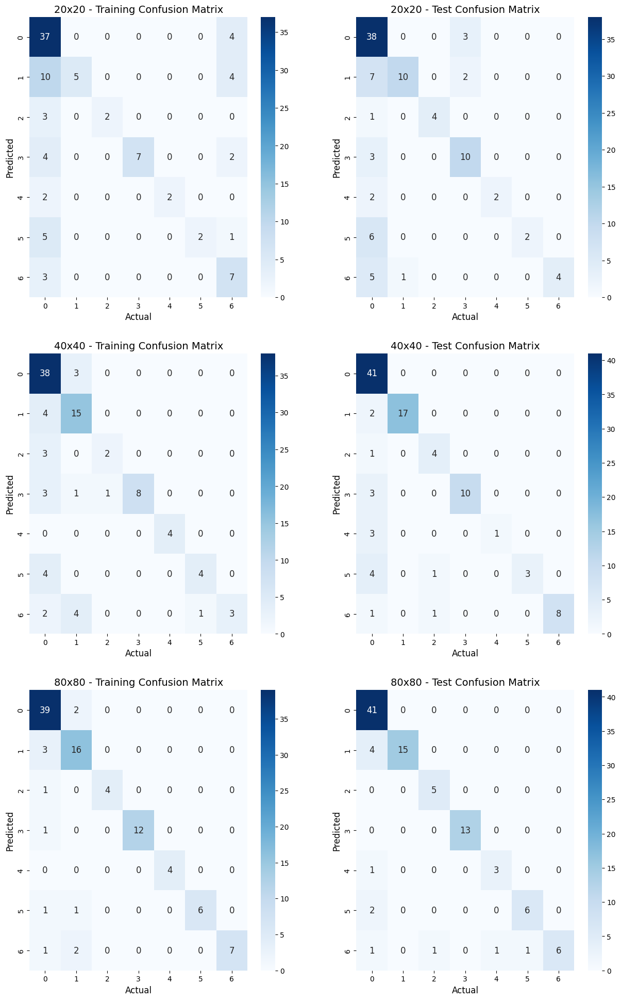

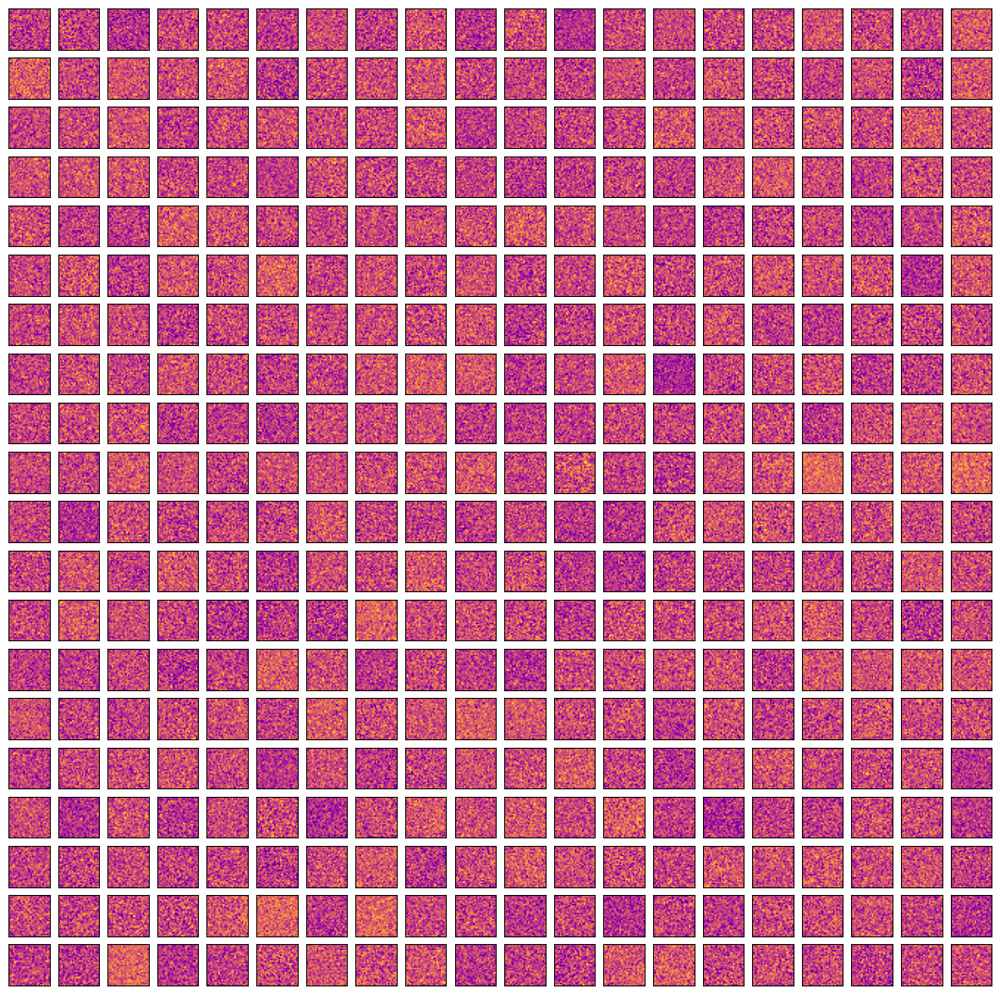

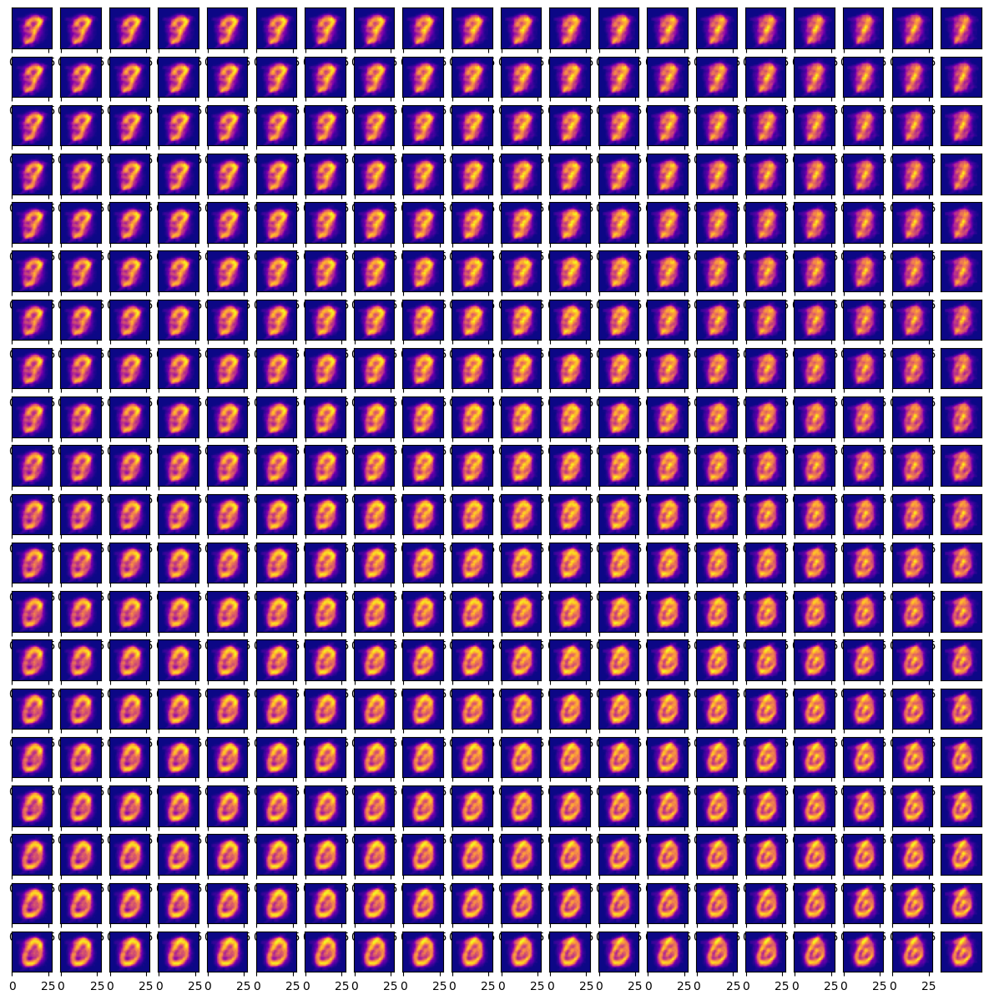

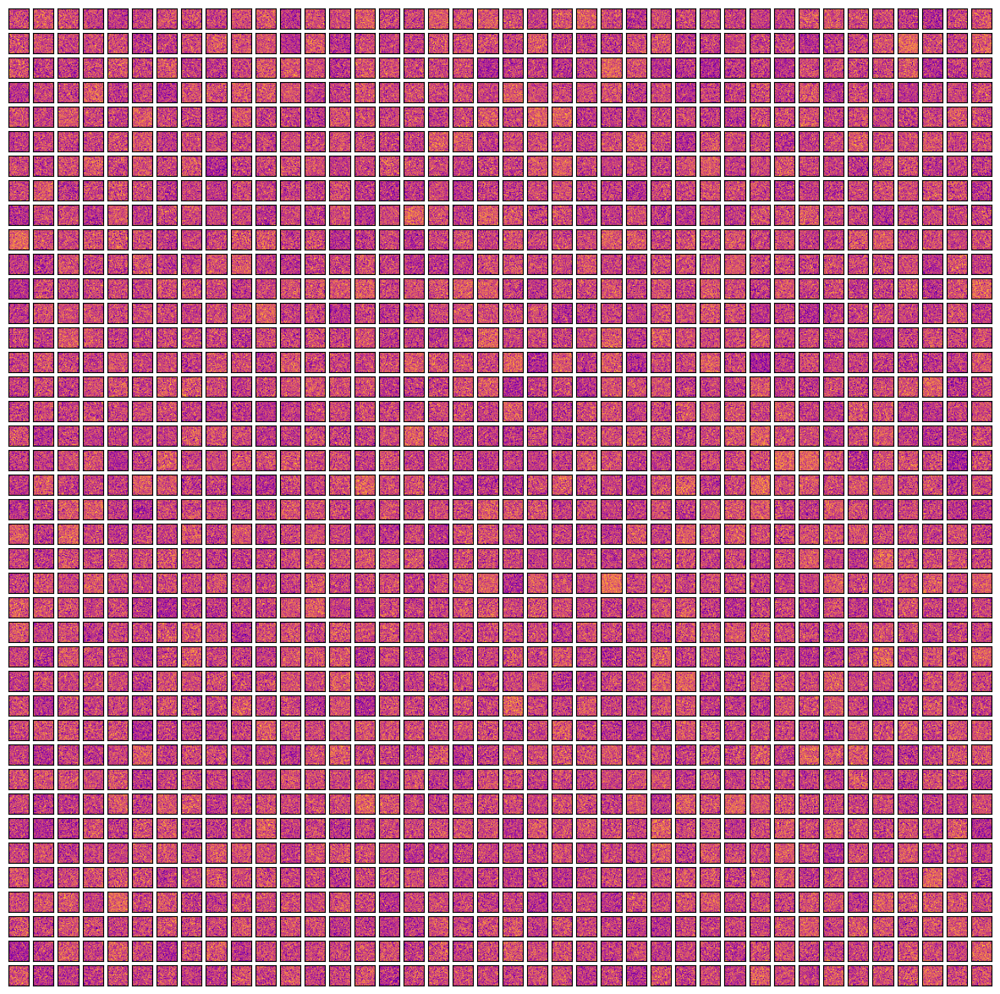

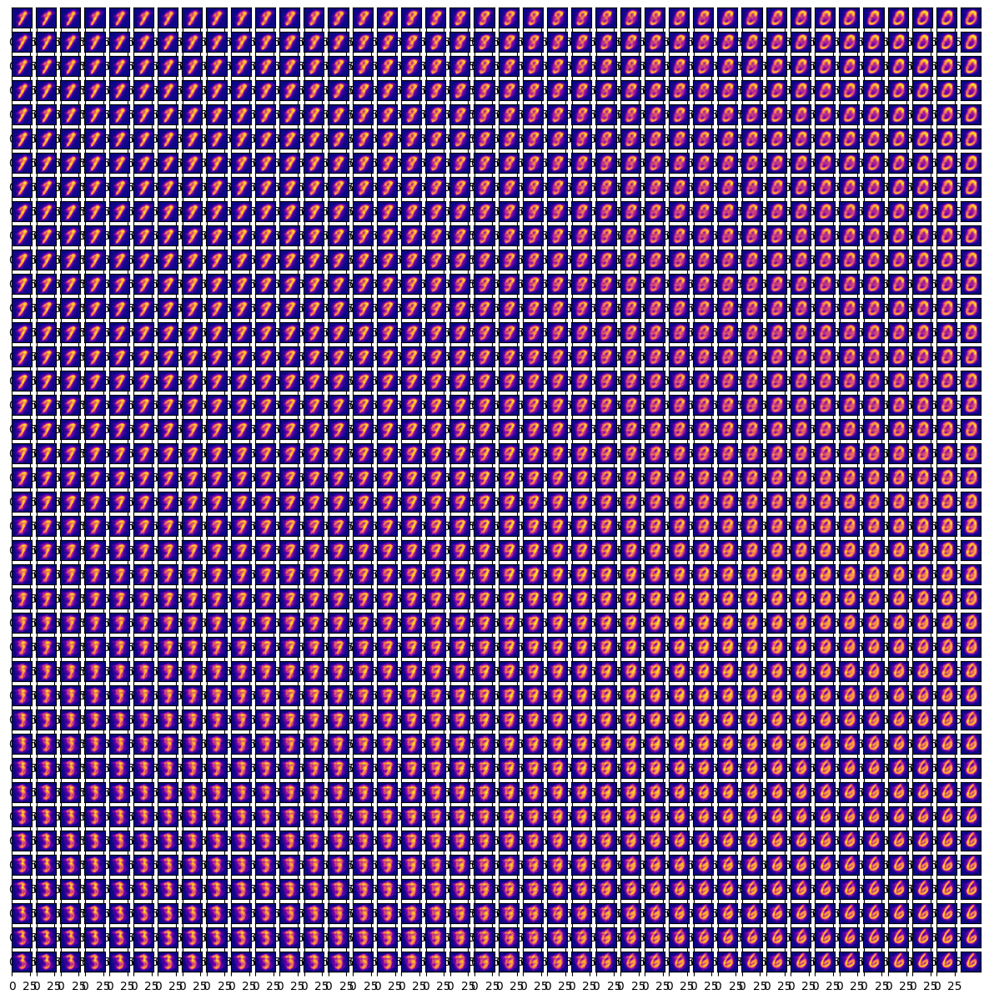

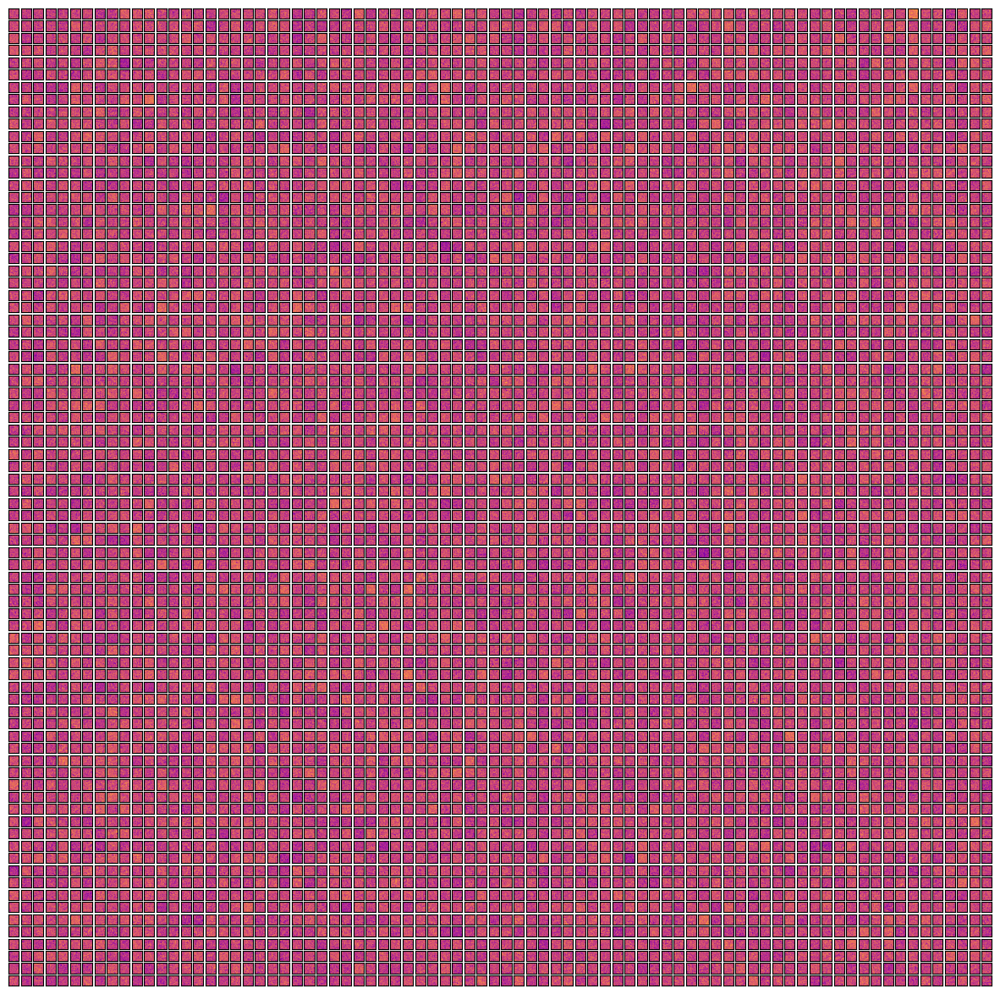

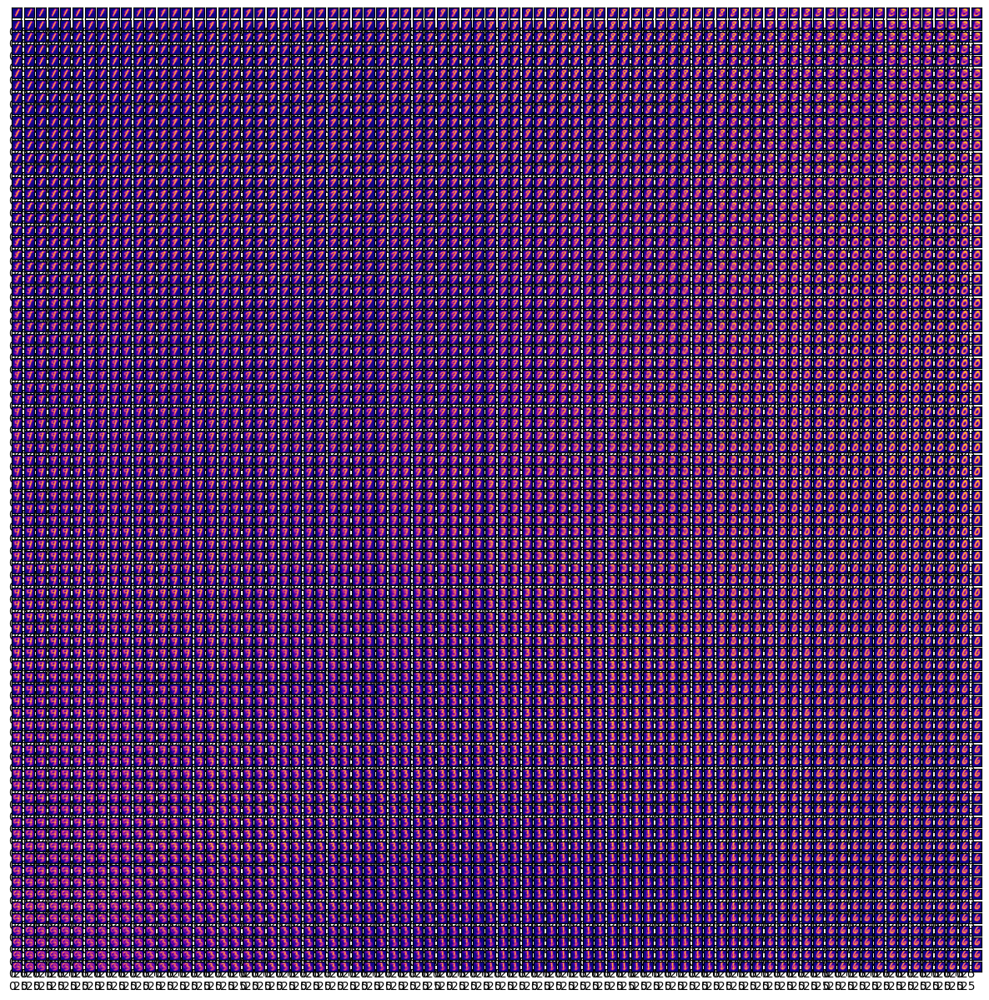

In [114]:
import seaborn as sns

(Xtr, Ltr), (X_test, L_test) = mnist.load_data()
sample_size = 100

Xtr = Xtr[:sample_size]
Ltr = Ltr[:sample_size]
X_test = X_test[:sample_size]
L_test = L_test[:sample_size]

# Flatten and normalize
Xtr_flatten = Xtr.reshape(Xtr.shape[0], -1) / 255.0
X_test_flatten = X_test.reshape(X_test.shape[0], -1) / 255.0


# Plot confusion matrices for 20x20, 40x40, 80x80 SOM grids
number_of_dimensions = [20, 40, 80]
fig, axes = plt.subplots(len(number_of_dimensions), 2, figsize=(15, len(number_of_dimensions) * 8))

for i, ndim in enumerate(number_of_dimensions):
    # Train SOM
    som_trained = SOM([28, 28], Xtr_flatten, showMode=1, ndim=ndim)

    # Initialize confusion matrices
    nrows=ndim
    ncols=ndim
    grid_color=np.zeros((nrows,ncols))
    nclasses=np.max(classes)

    confusion_matrix=np.zeros((nclasses,nclasses))

    # Plot training confusion matrix
    grid_color,confusion_matrix =SOM_Test (Xtr_flatten, som_trained, classes, grid_color, confusion_matrix, ndim)
    sns.heatmap(confusion_matrix, annot=True, annot_kws={"size": 12}, ax=axes[i, 0], cmap="Blues")
    axes[i, 0].set_title(f"{ndim}x{ndim} - Training Confusion Matrix", fontsize=14)
    axes[i, 0].set_ylabel("Predicted", fontsize=12)
    axes[i, 0].set_xlabel("Actual", fontsize=12)
    print(f"{ndim}x{ndim} Training Accuracy: {np.trace(confusion_matrix) / np.sum(confusion_matrix)}")

    confusion_matrix=np.zeros((nclasses,nclasses))
    # Plot test confusion matrix
    grid_color,test_confusion_matrix=SOM_Test (X_test_flatten, som_trained, classes, grid_color, confusion_matrix, ndim)
    sns.heatmap(test_confusion_matrix, annot=True, annot_kws={"size": 12}, ax=axes[i, 1], cmap="Blues")
    axes[i, 1].set_title(f"{ndim}x{ndim} - Test Confusion Matrix", fontsize=14)
    axes[i, 1].set_ylabel("Predicted", fontsize=12)
    axes[i, 1].set_xlabel("Actual", fontsize=12)
    print(f"{ndim}x{ndim} Test Accuracy: {np.trace(test_confusion_matrix) / np.sum(test_confusion_matrix)}")

# Adjust layout
plt.tight_layout()
plt.show()


In [115]:
# plt.close()
# plt.imshow(grid_color)
# plt.show()

In [116]:
#Confusion_Matrix, input_vector_database[0].shape, np.sum(Confusion_Matrix)

## Initializing the weights in the SOM network randomly
- Train SOM with grid `20 x 20`,`40 x 40`, `80 x 80`

In [117]:
def getAccuracy(confusion_matrix):
    return np.trace(confusion_matrix) / np.sum(confusion_matrix)

6. For a fixed number of iterations increase and decrease the learning rate of
SOM:
o What is the resulting effect?

When trying a learing rate between 0.1 and 1.0 we see an increas in the accuracy until the learning rate reaches apporoxymatly 0.85 where accuracy reaches its peak of värde.

The SOM's accuracy increases with the learning rate up to an optimal point (e.g., 0.85) where it adapts effectively to the data, but beyond that, a higher learning rate causes possible instability and overshooting, leading to decreased accuracy.

The data shows that as the learning rate increases, the accuracy generally improves, peaking at learning rates around 0.9526 and 1.0 with an accuracy of 0.67. However, the optimal learning rate appears to be in the range of 0.81 to 1.0, suggesting that while higher rates can lead to good performance, there's a delicate balance beyond which accuracy may drop, potentially due to instability or overshooting during training.

In [ ]:

start_lr = 0.1  
end_lr = 1.0    
num_values = 20 
learning_rates = np.linspace(start_lr, end_lr, num_values)

best_learning_rate = 0
best_accuracy = 0
runs = 10
for lr in learning_rates:
    print(f"Learning Rate: {lr}")
    accuracy = 0
    for run in range(runs):
        som_trained = SOM([28, 28], Xtr_flatten, ndim=20, eta0=lr)
        confusion_matrix, shape, sum_matrix = getConfusionMatrix(Xtr_flatten, som_trained, ndim=20)
        accuracy += np.trace(confusion_matrix) / sum_matrix / runs
    print(f"Accuracy: {accuracy}")
    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_learning_rate = lr

print(f"Best Learning Rate: {best_learning_rate}")
print(f"Best Accuracy: {best_accuracy}")

Learning Rate: 0.1
Accuracy: 0.59
Learning Rate: 0.1473684210526316
Accuracy: 0.58
Learning Rate: 0.19473684210526315
Accuracy: 0.56
Learning Rate: 0.24210526315789474
Accuracy: 0.56
Learning Rate: 0.2894736842105263
Accuracy: 0.61
Learning Rate: 0.33684210526315794
Accuracy: 0.61
Learning Rate: 0.38421052631578945
Accuracy: 0.64
Learning Rate: 0.43157894736842106
Accuracy: 0.56
Learning Rate: 0.4789473684210527
Accuracy: 0.51
Learning Rate: 0.5263157894736842
Accuracy: 0.65
Learning Rate: 0.5736842105263158
Accuracy: 0.6
Learning Rate: 0.6210526315789474
Accuracy: 0.55
Learning Rate: 0.6684210526315789
Accuracy: 0.61
Learning Rate: 0.7157894736842105
Accuracy: 0.62
Learning Rate: 0.7631578947368421
Accuracy: 0.62
Learning Rate: 0.8105263157894737
Accuracy: 0.67
Learning Rate: 0.8578947368421053
Accuracy: 0.65
Learning Rate: 0.9052631578947369
Accuracy: 0.59
Learning Rate: 0.9526315789473684
Accuracy: 0.7
Learning Rate: 1.0
Accuracy: 0.67
Best Learning Rate: 0.9526315789473684
Best Acc

7. For a fixed number of iterations and the best learning rate increase and
decrease the exponential decay of the neighbourhood parameter.
8. What is the effect?
Testing to increase the decay rate from 0.01 to 0.6 gave an increasing accuracy untill the decay rate hit 0.33 where the accuracy stabilizes at approx 99% 

In [120]:
start_lr = 0.01  
end_lr = 0.6    
num_values = 25 
decay_values = np.linspace(start_lr, end_lr, num_values)

best_accuracy = 0
best_decay_value = 0

for decay_value in decay_values:
    print(f"Decay Rate: {decay_value}")
    accuracy = 0
    for run in range(5):
        som_trained = SOM([28, 28], Xtr_flatten, ndim=20, eta0=0.85, etadecay=0.05, sgm0=20, sgmdecay=decay_value, showMode=0)
        
        confusion_matrix, shape, sum_matrix = getConfusionMatrix(Xtr_flatten, som_trained, ndim=20)
        accuracy += np.trace(confusion_matrix) / sum_matrix / 5
    print(f"Accuracy: {accuracy}")
    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_decay_value = decay_value

print(f"Best Decay Value: {best_decay_value}")
print(f"Best Accuracy: {best_accuracy}")

Decay Rate: 0.01
Accuracy: 0.56
Decay Rate: 0.034583333333333334
Accuracy: 0.64
Decay Rate: 0.059166666666666666
Accuracy: 0.65
Decay Rate: 0.08374999999999999
Accuracy: 0.76
Decay Rate: 0.10833333333333332
Accuracy: 0.79
Decay Rate: 0.13291666666666666
Accuracy: 0.794
Decay Rate: 0.1575
Accuracy: 0.8259999999999998
Decay Rate: 0.18208333333333332
Accuracy: 0.8399999999999999
Decay Rate: 0.20666666666666667
Accuracy: 0.8859999999999999
Decay Rate: 0.23125
Accuracy: 0.9039999999999999
Decay Rate: 0.2558333333333333
Accuracy: 0.9319999999999999
Decay Rate: 0.28041666666666665
Accuracy: 0.968
Decay Rate: 0.305
Accuracy: 0.974
Decay Rate: 0.32958333333333334
Accuracy: 0.984
Decay Rate: 0.35416666666666663
Accuracy: 0.988
Decay Rate: 0.37875
Accuracy: 0.99
Decay Rate: 0.4033333333333333
Accuracy: 0.986
Decay Rate: 0.42791666666666667
Accuracy: 0.99
Decay Rate: 0.4525
Accuracy: 0.99
Decay Rate: 0.4770833333333333
Accuracy: 0.99
Decay Rate: 0.5016666666666666
Accuracy: 0.99
Decay Rate: 0.5262